In [1]:
# Imports
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import os

from tensorflow.keras import backend
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
import tensorflow as tf
from scipy.optimize import fmin_l_bfgs_b

In [2]:
tf.compat.v1.disable_eager_execution()

In [3]:
tf.config.list_physical_devices('GPU')
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [4]:
# Hyperparams
ITERATIONS = 20
CHANNELS = 3
IMAGE_SIZE = 500
IMAGE_WIDTH = IMAGE_SIZE
IMAGE_HEIGHT = IMAGE_SIZE
IMAGENET_MEAN_RGB_VALUES = [123.68, 116.779, 103.939]
CONTENT_WEIGHT = 0.02
# STYLE_WEIGHT = 4.5
STYLE_WEIGHT = 10.0
TOTAL_VARIATION_WEIGHT = 0.995
TOTAL_VARIATION_LOSS_FACTOR = 1.25

In [40]:
# Paths
input_image_path = "input/012.jpg"
style_image_path = "style/浮世绘.jpg"
# output_image_dir = "output/111/"
output_image_dir = "output/{}_{}/".format(str(style_image_path.split("/")[-1].split(".")[0]),str(input_image_path.split("/")[-1].split(".")[0]))
# combined_image_path = "combined.png"

try:
    os.mkdir(output_image_dir)
except: pass

# San Francisco
# san_francisco_image_path = "https://upload.wikimedia.org/wikipedia/commons/f/f9/Beijing_West_Railway_Station_%2820180628184009%29.jpg"
# san_francisco_image_path = "http://n.sinaimg.cn/sinakd20210718s/786/w786h800/20210718/3a50-a5849a627e3307835e6806003a2e45e0.jpg"

# Warsaw by Tytus Brzozowski, http://t-b.pl
# tytus_image_path = "http://meetingbenches.com/wp-content/flagallery/tytus-brzozowski-polish-architect-and-watercolorist-a-fairy-tale-in-warsaw/tytus_brzozowski_13.jpg"

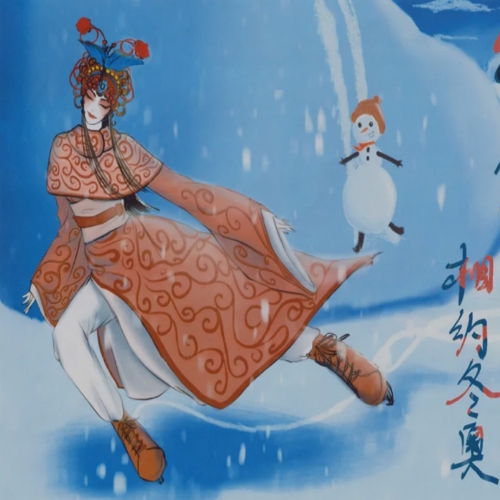

In [41]:
#Input visualization 
# input_image = Image.open(BytesIO(requests.get(san_francisco_image_path).content))
input_image = Image.open(input_image_path)
input_image = input_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
input_image_bk = input_image
# input_image.save(input_image_path)
input_image

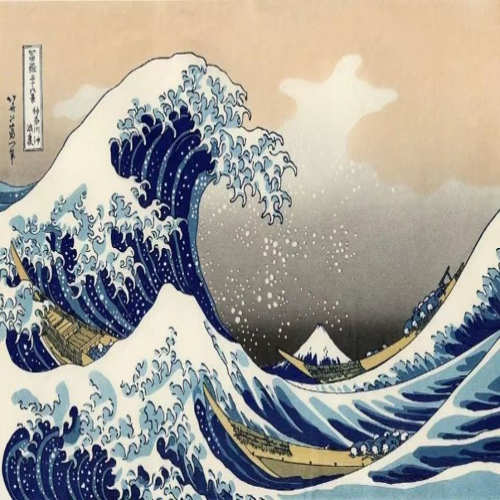

In [42]:
# Style visualization 
# style_image = Image.open(BytesIO(requests.get(tytus_image_path).content))
style_image = Image.open(style_image_path)
style_image = style_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
style_image_bk = style_image
# style_image.save(style_image_path)
style_image

In [43]:
# Data normalization and reshaping from RGB to BGR
input_image_array = np.asarray(input_image, dtype="float32")
input_image_array = np.expand_dims(input_image_array, axis=0)
input_image_array[:, :, :, 0] -= IMAGENET_MEAN_RGB_VALUES[2]
input_image_array[:, :, :, 1] -= IMAGENET_MEAN_RGB_VALUES[1]
input_image_array[:, :, :, 2] -= IMAGENET_MEAN_RGB_VALUES[0]
input_image_array = input_image_array[:, :, :, ::-1]

style_image_array = np.asarray(style_image, dtype="float32")
style_image_array = np.expand_dims(style_image_array, axis=0)
style_image_array[:, :, :, 0] -= IMAGENET_MEAN_RGB_VALUES[2]
style_image_array[:, :, :, 1] -= IMAGENET_MEAN_RGB_VALUES[1]
style_image_array[:, :, :, 2] -= IMAGENET_MEAN_RGB_VALUES[0]
style_image_array = style_image_array[:, :, :, ::-1]


In [44]:
# Model
input_image = backend.variable(input_image_array)
style_image = backend.variable(style_image_array)
combination_image = backend.placeholder((1, IMAGE_HEIGHT, IMAGE_SIZE, 3))

input_tensor = backend.concatenate([input_image,style_image,combination_image], axis=0)
model = VGG16(input_tensor=input_tensor, include_top=False)

In [45]:
def content_loss(content, combination):
    return backend.sum(backend.square(combination - content))

layers = dict([(layer.name, layer.output) for layer in model.layers])

content_layer = "block2_conv2"
layer_features = layers[content_layer]
content_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]

loss = backend.variable(0.)
loss = loss + CONTENT_WEIGHT * content_loss(content_image_features,
                                      combination_features)

In [46]:
def gram_matrix(x):
    features = backend.batch_flatten(backend.permute_dimensions(x, (2, 0, 1)))
    gram = backend.dot(features, backend.transpose(features))
    return gram

In [47]:
def compute_style_loss(style, combination):
    style = gram_matrix(style)
    combination = gram_matrix(combination)
    size = IMAGE_HEIGHT * IMAGE_WIDTH
    return backend.sum(backend.square(style - combination)) / (4. * (CHANNELS ** 2) * (size ** 2))

style_layers = ["block1_conv2", "block2_conv2", "block3_conv3", "block4_conv3", "block5_conv3"]
for layer_name in style_layers:
    layer_features = layers[layer_name]
    style_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    style_loss = compute_style_loss(style_features, combination_features)
    loss += (STYLE_WEIGHT / len(style_layers)) * style_loss

In [48]:
def total_variation_loss(x):
    a = backend.square(x[:, :IMAGE_HEIGHT-1, :IMAGE_WIDTH-1, :] - x[:, 1:, :IMAGE_WIDTH-1, :])
    b = backend.square(x[:, :IMAGE_HEIGHT-1, :IMAGE_WIDTH-1, :] - x[:, :IMAGE_HEIGHT-1, 1:, :])
    return backend.sum(backend.pow(a + b, TOTAL_VARIATION_LOSS_FACTOR))

loss += TOTAL_VARIATION_WEIGHT * total_variation_loss(combination_image)

In [49]:
outputs = [loss]
outputs += backend.gradients(loss, combination_image)

def evaluate_loss_and_gradients(x):
    x = x.reshape((1, IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
    outs = backend.function([combination_image], outputs)([x])
    loss = outs[0]
    gradients = outs[1].flatten().astype("float64")
    return loss, gradients

class Evaluator:

    def loss(self, x):
        loss, gradients = evaluate_loss_and_gradients(x)
        self._gradients = gradients
        return loss

    def gradients(self, x):
        return self._gradients

evaluator = Evaluator()

In [50]:
x = np.random.uniform(0, 255, (1, IMAGE_HEIGHT, IMAGE_WIDTH, 3)) - 128.

for i in range(ITERATIONS):
    x, loss, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(), fprime=evaluator.gradients, maxfun=20)
    print("Iteration %d completed with loss %d" % (i, loss))
    xo = x.copy()
    xo = xo.reshape((IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
    xo = xo[:, :, ::-1]
    xo[:, :, 0] += IMAGENET_MEAN_RGB_VALUES[2]
    xo[:, :, 1] += IMAGENET_MEAN_RGB_VALUES[1]
    xo[:, :, 2] += IMAGENET_MEAN_RGB_VALUES[0]
    xo = np.clip(xo, 0, 255).astype("uint8")
    output_image = Image.fromarray(xo)
    output_image.save(str(output_image_dir) + 'output_review{}.png'.format(str(i)))
output_image_bk = output_image

Iteration 0 completed with loss 130052890624
Iteration 1 completed with loss 64544231424
Iteration 2 completed with loss 42707550208
Iteration 3 completed with loss 34983837696
Iteration 4 completed with loss 30655348736
Iteration 5 completed with loss 28547540992
Iteration 6 completed with loss 27079008256
Iteration 7 completed with loss 26198040576
Iteration 8 completed with loss 25558272000
Iteration 9 completed with loss 25178275840
Iteration 10 completed with loss 24901820416
Iteration 11 completed with loss 24700432384
Iteration 12 completed with loss 24532262912
Iteration 13 completed with loss 24399147008
Iteration 14 completed with loss 24292050944
Iteration 15 completed with loss 24199737344
Iteration 16 completed with loss 24125759488
Iteration 17 completed with loss 24062396416
Iteration 18 completed with loss 24009330688
Iteration 19 completed with loss 23964422144


727 548
500 500
(727, 548)


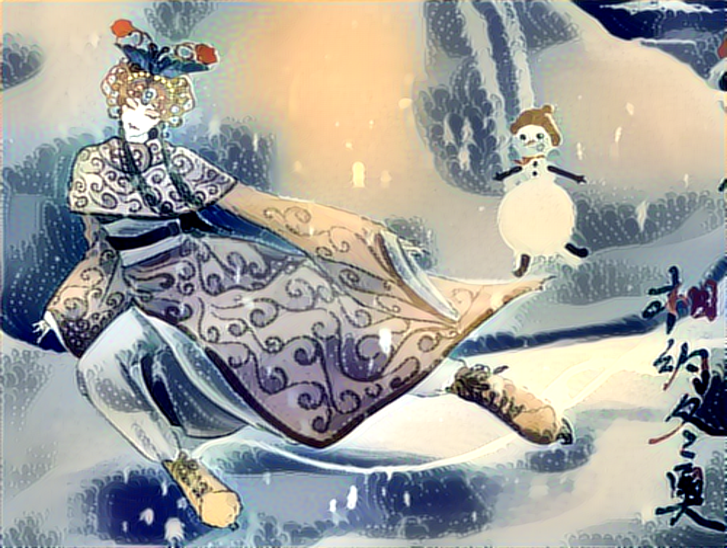

In [56]:
input_image = Image.open(input_image_path)
iwidth, iheight = input_image.size
print(iwidth, iheight)
owidth, oheight = output_image.size
print(owidth, oheight)
if (owidth <= iwidth) or (oheight <= iheight):
    output_image = output_image.resize((iwidth, iheight))
output_image.save(str(output_image_dir) + "output.png")
print(output_image.size)
output_image

In [52]:
# input_image_bk, style_image_bk, output_image_bk

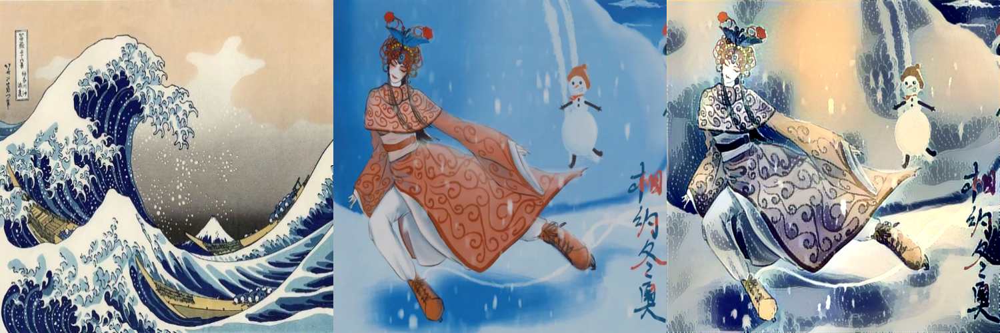

In [53]:
# Visualizing combined results
combined_image_path = "{}output_combined.png".format(output_image_dir)
combined = Image.new("RGB", (IMAGE_WIDTH*3, IMAGE_HEIGHT))
x_offset = 0
# for image in map(Image.open, [input_image_path, style_image_path, str(output_image_dir) + "output.png"]):
# for image in [input_image.resize((IMAGE_SIZE, IMAGE_SIZE)), style_image.resize((IMAGE_SIZE, IMAGE_SIZE)), output_image.resize((IMAGE_SIZE, IMAGE_SIZE))]:
for image in [style_image_bk, input_image_bk, output_image_bk]:
    combined.paste(image, (x_offset, 0))
    x_offset += IMAGE_WIDTH
combined.save(combined_image_path)
combined

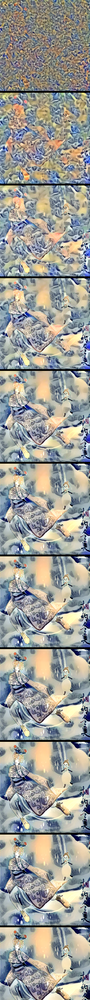

In [54]:
# 显示10轮迭代的中间输出预览
combined_output = Image.new("RGB", (IMAGE_WIDTH, IMAGE_HEIGHT*11))
x_offset = 0
y_offset = 0

for i in range(ITERATIONS):
    image = Image.open(str(output_image_dir) + 'output_review{}.png'.format(str(i)))
    combined_output.paste(image, (x_offset, y_offset))
    y_offset += IMAGE_WIDTH + 10
combined_output